# CoDA — Graph snapshots **only when changed** (uncertainty-aware)

This notebook runs acquisition → extinction with the uncertainty-aware split rule, but **only draws a graph snapshot when the graph changes** relative to the previous episode.

**Change criterion** (fast, deterministic):
- Any change in transition tensor shape (e.g., new clone added).
- After aggregating over actions, any change in the **thresholded** adjacency (same threshold as the plotter).
- Any change in `clone_dict` mapping (detects clone re-wiring/merge).

This matches the visual “Graph at episode XX” you use, but avoids redundant frames.


In [1]:

import sys, numpy as np
# sys.path.append('/mnt/data')
from coda_trial_by_trial_util import CoDAAgent, CoDAConfig
from spatial_environments import GridEnvRightDownNoSelf, GridEnvRightDownNoCue
from util import generate_dataset, generate_dataset_post_augmentation


In [2]:
import numpy as np

def sanitize_for_plot(env, T, eps=1e-12):
    """
    Remove clones with ~zero inbound+outbound mass and rebuild reverse map.
    Safe for growing/shrinking T during splits/merges.
    """
    if T is None or getattr(T, "ndim", 0) != 3:
        return

    S = T.shape[0]

    # Outbound mass from each state: sum over actions and next states
    out_mass = T.sum(axis=(1, 2))   # shape [S]

    # Inbound mass to each state: sum over sources and actions
    in_mass  = T.sum(axis=(0, 1))   # shape [S]

    active = (out_mass + in_mass) > eps

    # Drop clone ids that are inactive or out of bounds
    for cl in list(env.clone_dict.keys()):
        if cl >= S or not active[cl]:
            env.clone_dict.pop(cl, None)

    # Rebuild reverse mapping (parent -> latest clone)
    env.reverse_clone_dict = {parent: cl for cl, parent in env.clone_dict.items()}

def make_terminals_absorbing_for_plot(T, terminals):
    T = T.copy()
    for t in terminals:
        if t < T.shape[0]:
            T[t, :, :] = 0.0
    return T
def thresh_adj(T, thr=0.3):
    A = T.sum(axis=1)         # [S,S]
    return (A >= thr).astype(np.uint8)

def clone_dict_tuple(d):
    return tuple(sorted(d.items()))

def graph_changed(prev_T, prev_map, curr_T, curr_map, thr=0.3):
    if prev_T is None or prev_T.shape != curr_T.shape:
        return True
    A_prev = thresh_adj(prev_T, thr)
    A_curr = thresh_adj(curr_T, thr)
    if A_prev.shape != A_curr.shape:
        return True
    if (A_prev != A_curr).any():
        return True
    return prev_map != curr_map



In [3]:

# --- Config ---
CUE = 5
THRESH = 0.3               # must match env.plot_graph threshold
cfg = CoDAConfig(
    theta_split=0.6, theta_merge=0.5,
    n_threshold=8, min_presence_episodes=3, min_effective_exposure=5.0,
    confidence=0.8, 
    count_decay=0.9, 
    # trace_decay=0.9,    # makes PC recent
    # retro_decay=0.9     # makes RC recent
)


# cfg.theta_split = 0.85
N_ACQ, N_EXT = 250, 300
MAX_STEPS = 20

env = GridEnvRightDownNoSelf(cue_states=[CUE], env_size=(4,4), rewarded_terminal=[15])
agent = CoDAAgent(env, cfg)


In [4]:

def thresh_adj(T, thr=0.3):
    """Aggregate over actions and threshold to binary adjacency."""
    A = T.sum(axis=1)   # [S,S]
    if A.ndim != 2:
        # handle empty / malformed
        return None
    return (A >= thr).astype(np.uint8)

def clone_dict_tuple(d):
    """Stable tuple view of clone mapping for change detection."""
    # sort by clone_id
    return tuple(sorted(d.items()))


In [5]:

def graph_changed(prev_T, prev_clone_map, curr_T, curr_clone_map, thr=THRESH):
    if prev_T is None:
        return True
    # shape change (e.g., clones added)
    if prev_T.shape != curr_T.shape:
        return True
    # adjacency change
    A_prev = thresh_adj(prev_T, thr=thr)
    A_curr = thresh_adj(curr_T, thr=thr)
    if A_prev is None or A_curr is None:
        return True
    if A_prev.shape != A_curr.shape:
        return True
    if np.any(A_prev != A_curr):
        return True
    # clone map change
    if prev_clone_map != curr_clone_map:
        return True
    return False


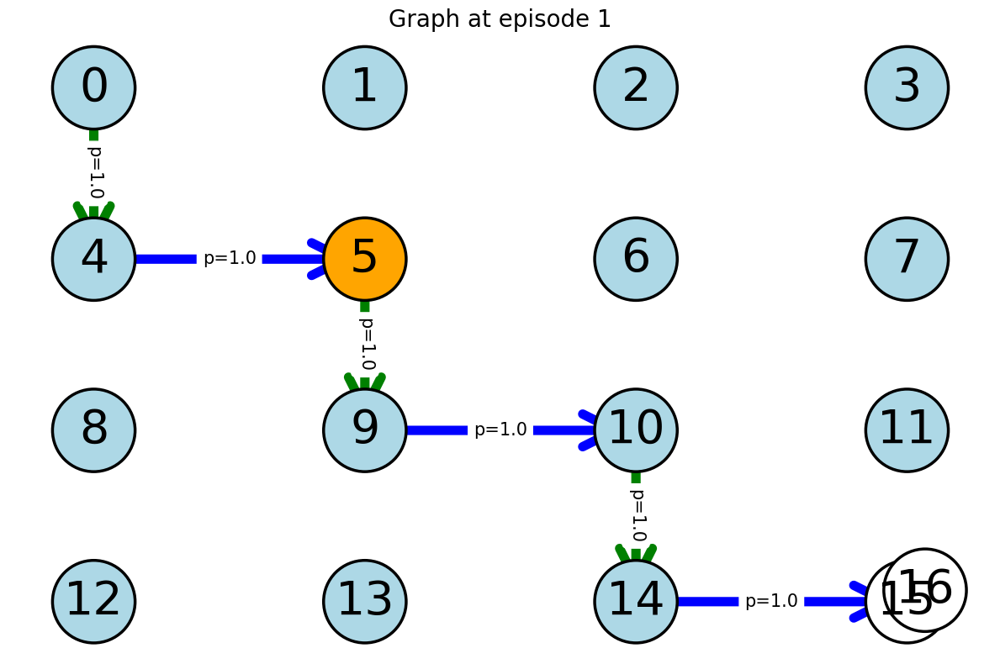

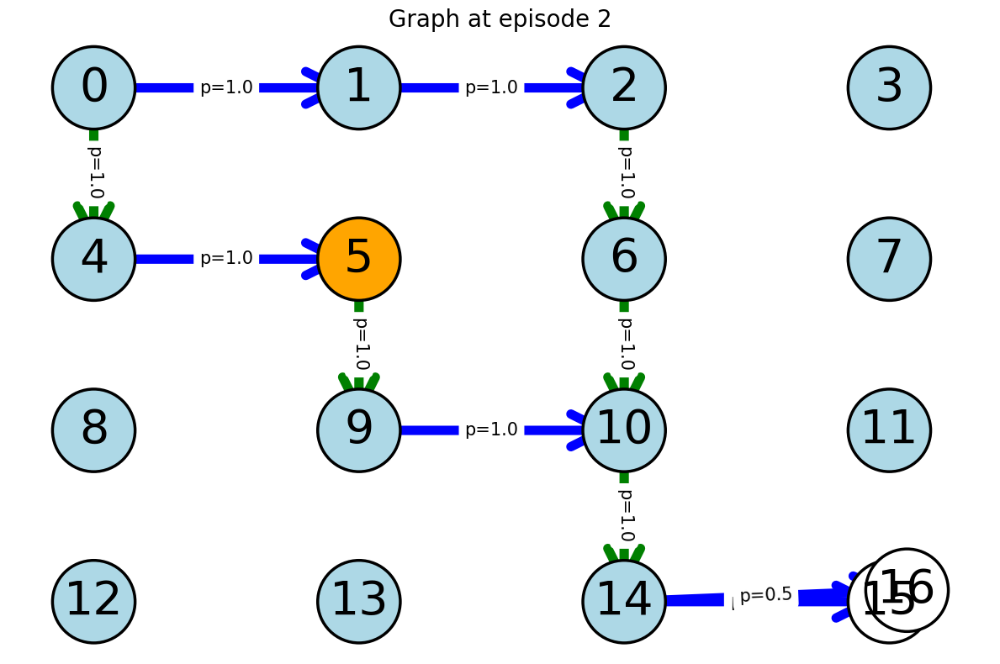

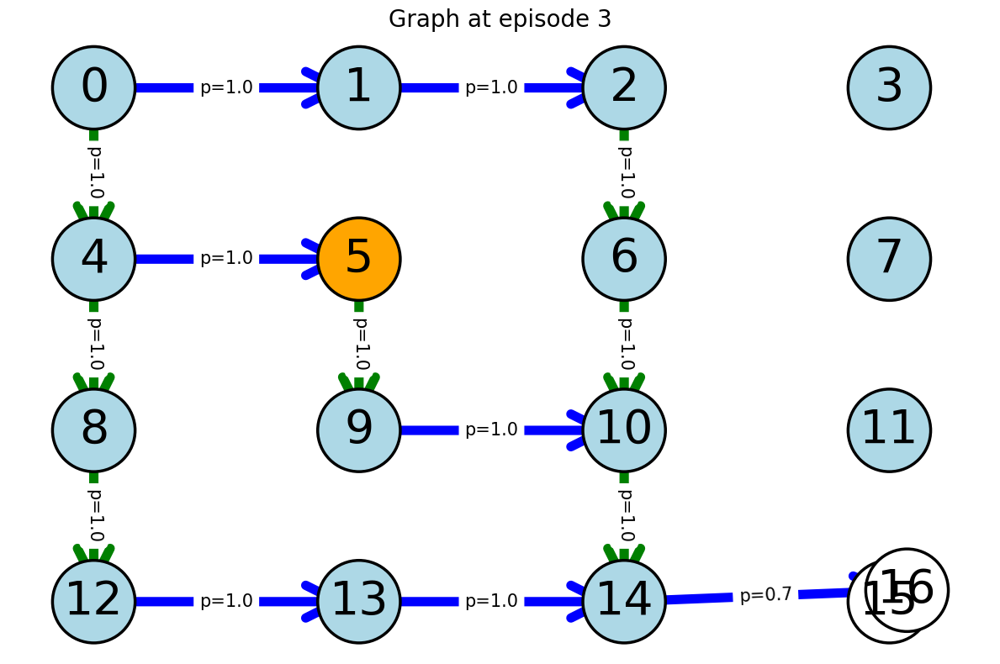

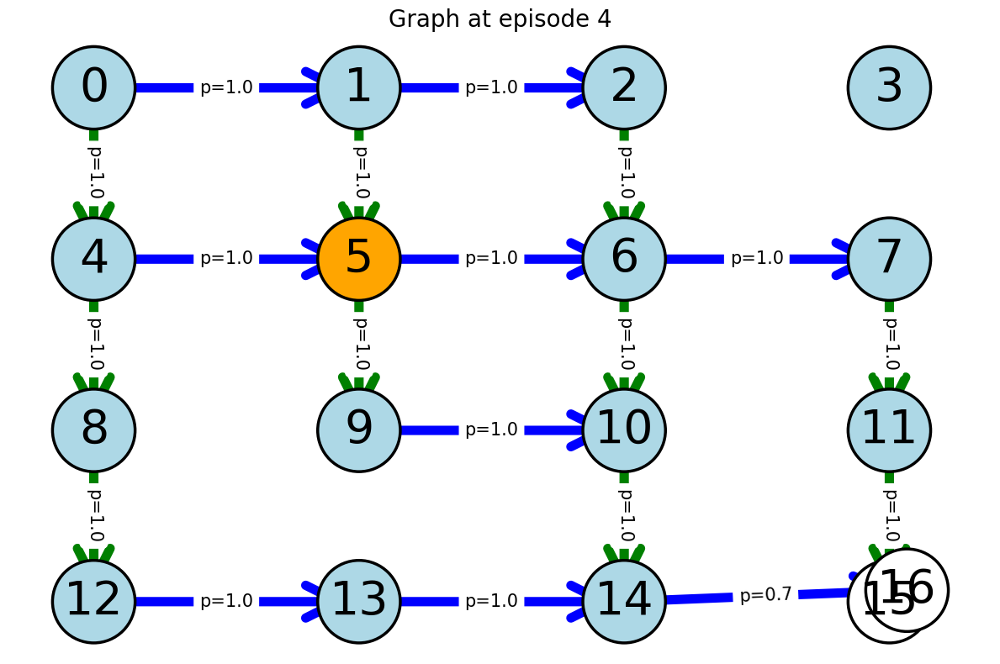

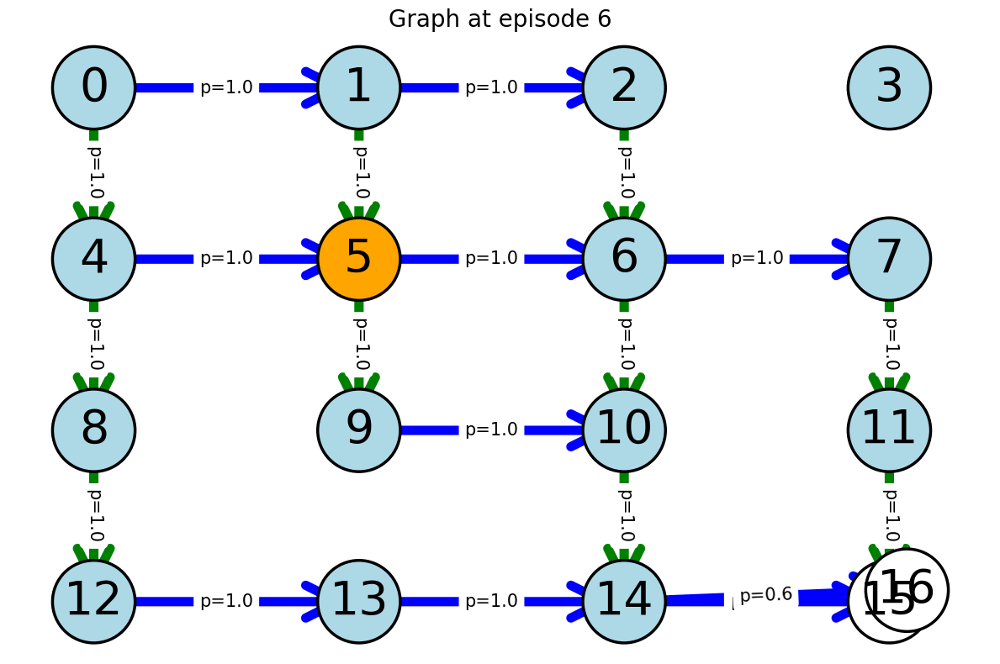

...

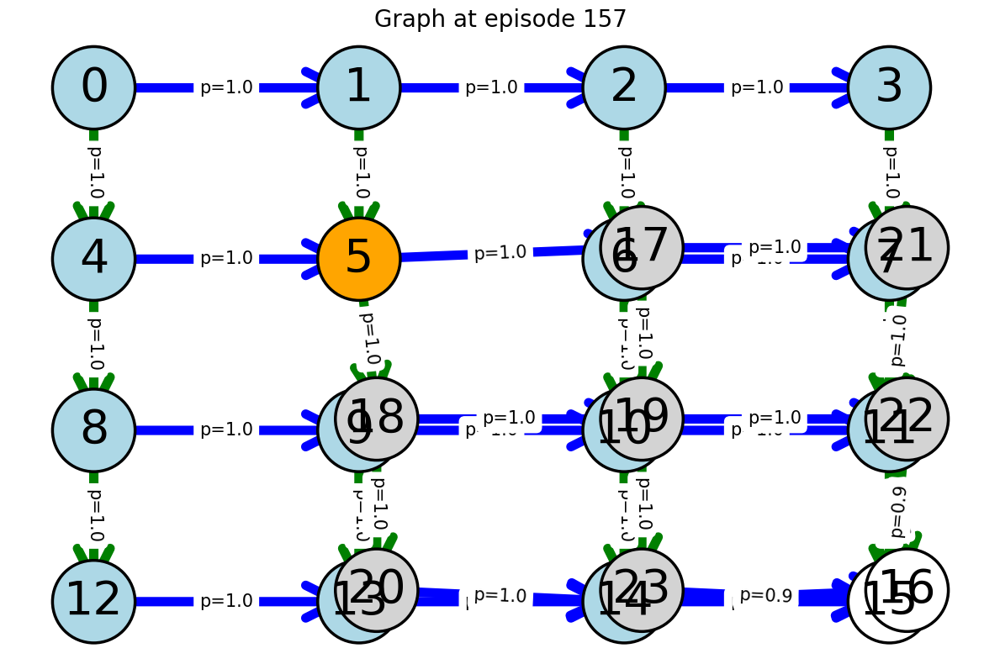

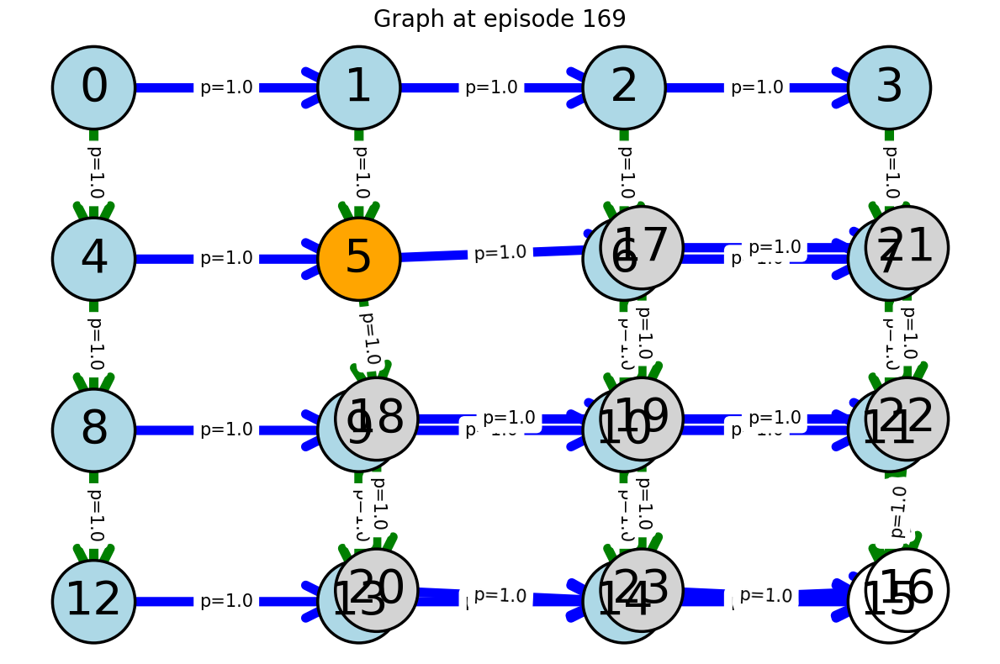

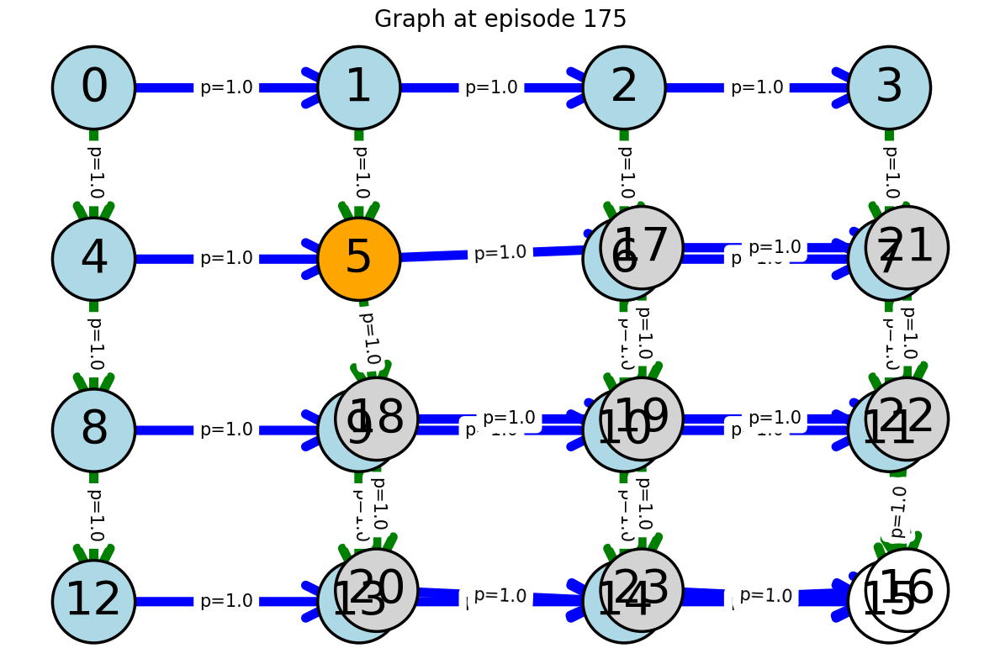

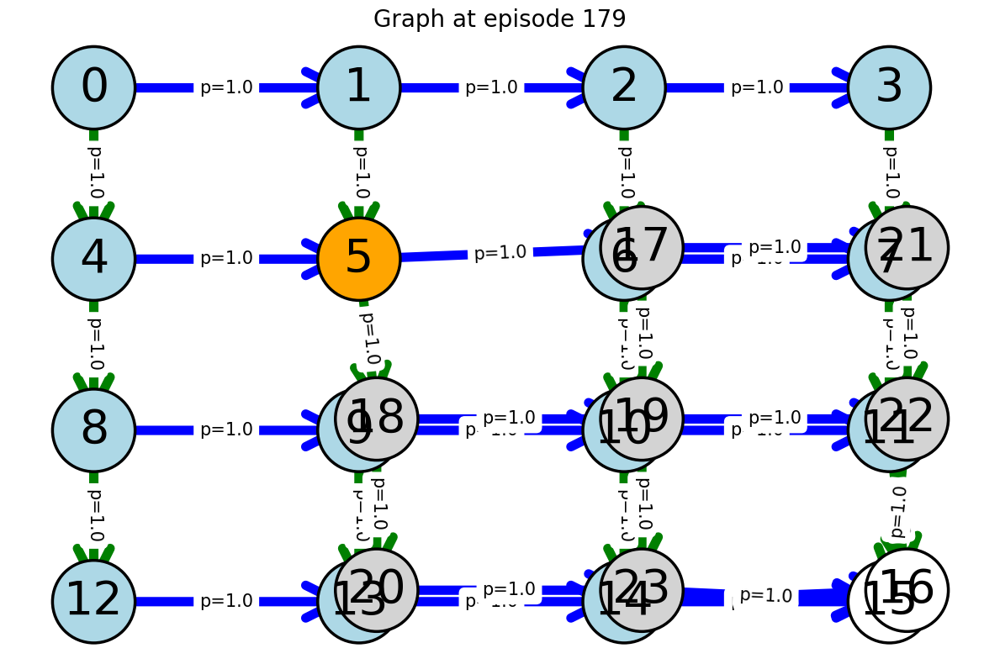

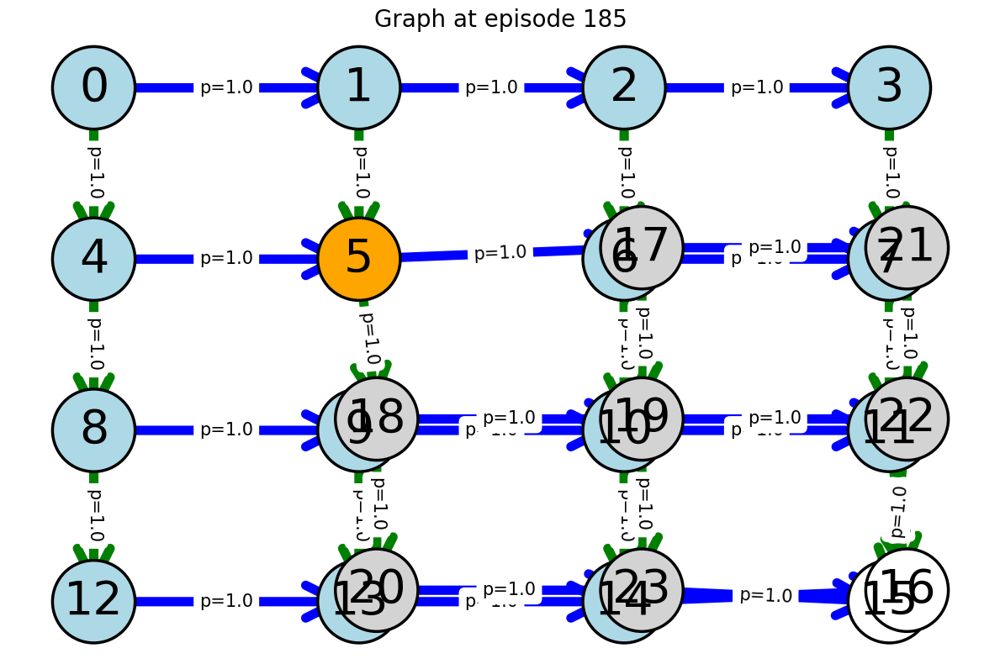

Changed episodes (acquisition): [1, 2, 3, 4, 6, 7, 10, 14, 15, 20, 32, 39, 42, 47, 50, 56, 58, 60, 63, 73] ... total: 53


In [6]:

# --- Run loops; only plot when changed ---
with_clones = False
prev_T = None
prev_map = None
changed_episodes = []

# Acquisition
for ep in range(1, N_ACQ+1):
    if with_clones:
        (states, actions) = generate_dataset_post_augmentation(env, agent.get_T(), n_episodes=1, max_steps=MAX_STEPS)[0]
    else:
        (states, actions) = generate_dataset(env, n_episodes=1, max_steps=MAX_STEPS)[0]

    agent.update_with_episode(states, actions)
    new = agent.maybe_split()
    if new:
        with_clones = True

    T_curr = agent.get_T().copy()
    map_curr = clone_dict_tuple(env.clone_dict)

    if graph_changed(prev_T, prev_map, T_curr, map_curr, thr=THRESH):





        
        sanitize_for_plot(env, T_curr)
        env.plot_graph(T_curr, niter=ep, threshold=THRESH, save=False, savename=f'graph_ep{ep}.png')
        changed_episodes.append(ep)
        prev_T, prev_map = T_curr, map_curr

print("Changed episodes (acquisition):", changed_episodes[:20], "... total:", len(changed_episodes))


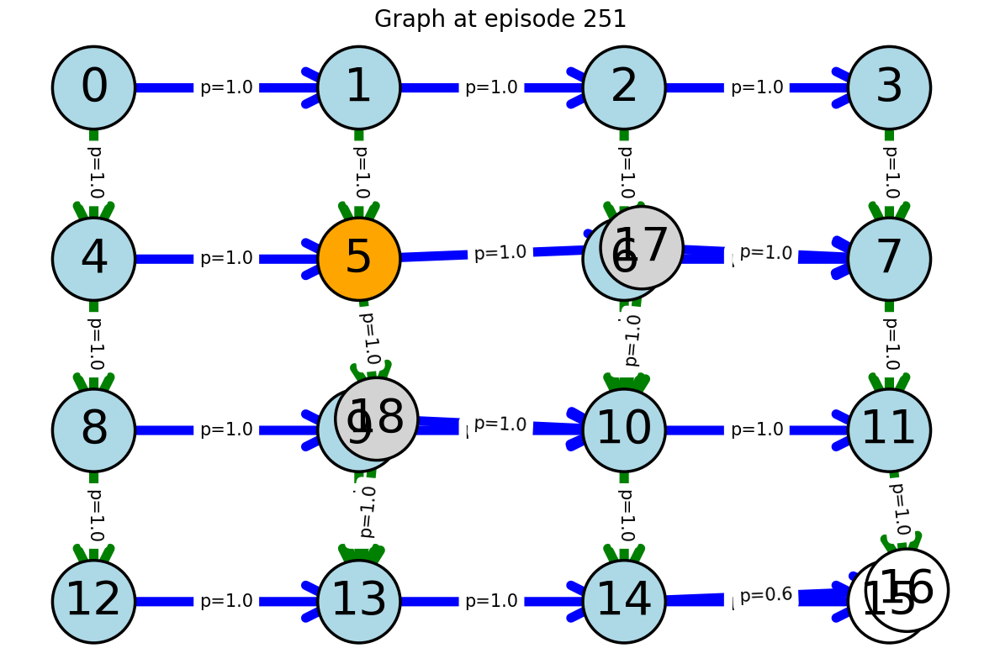

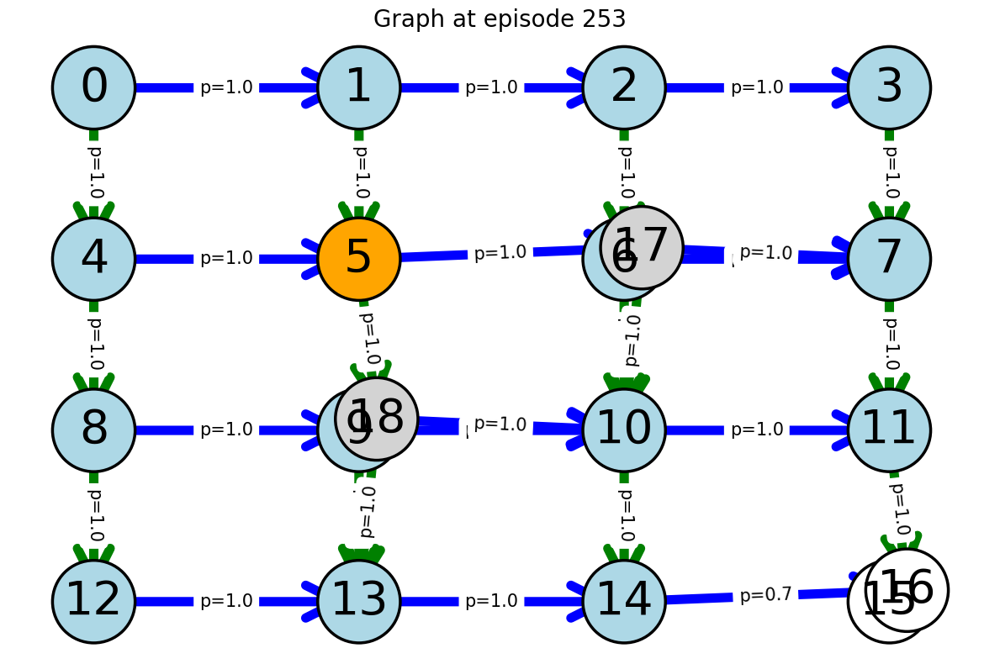

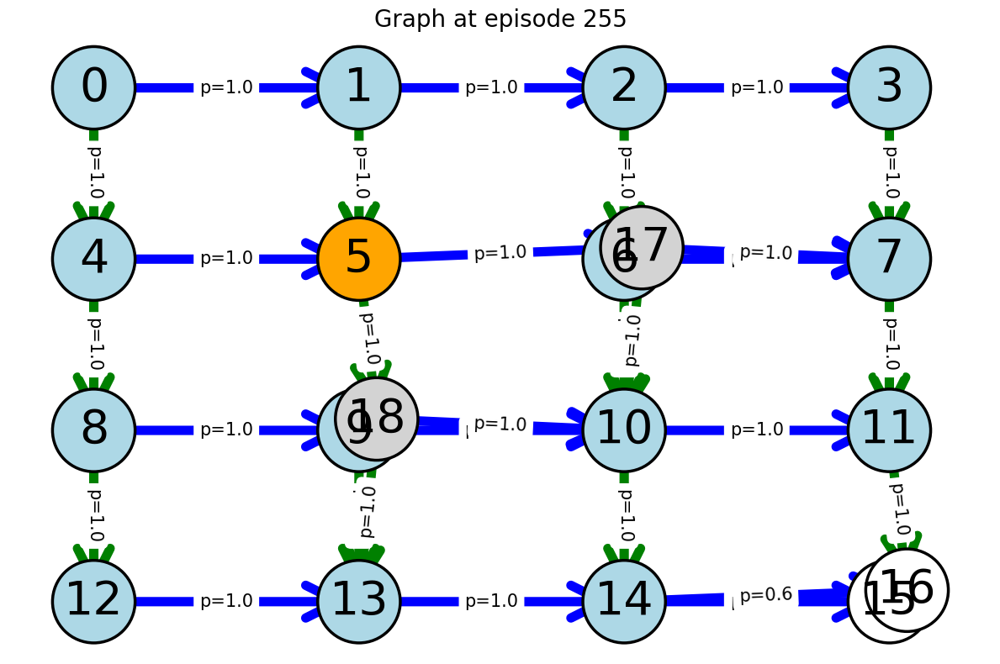

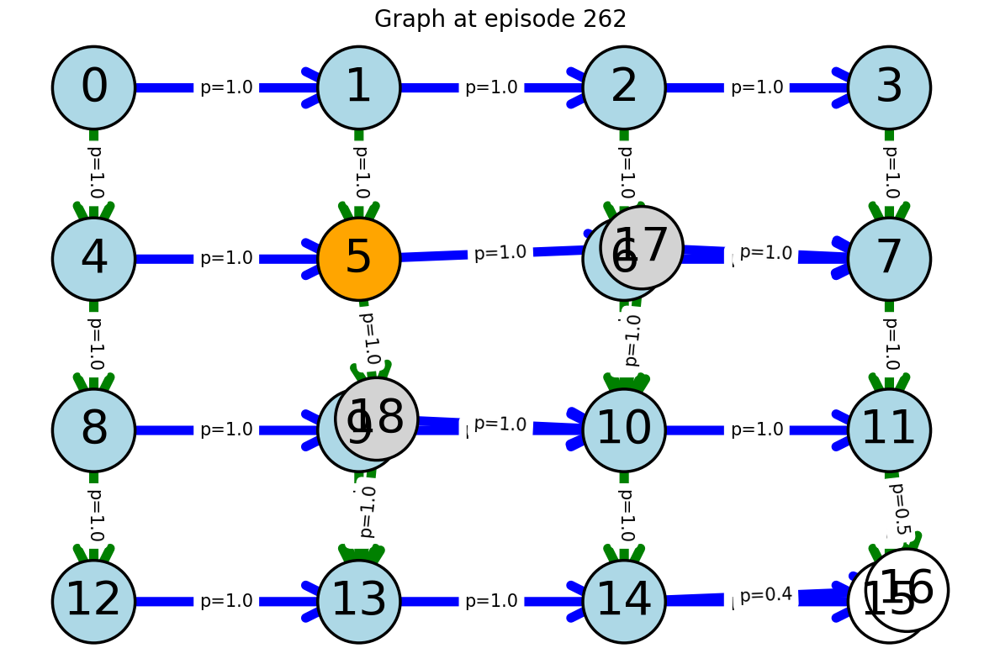

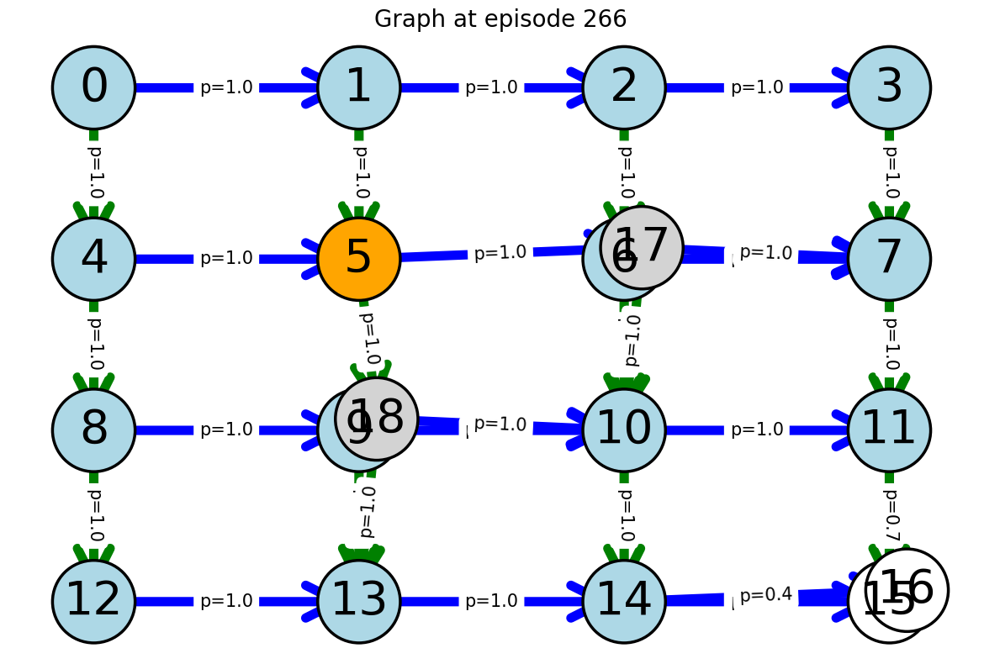

...

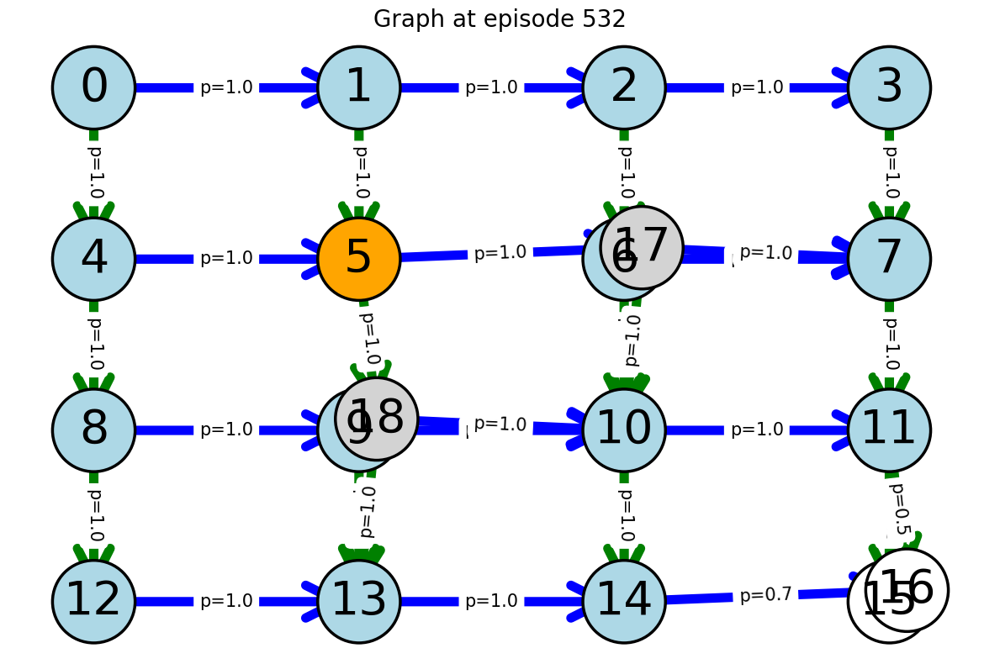

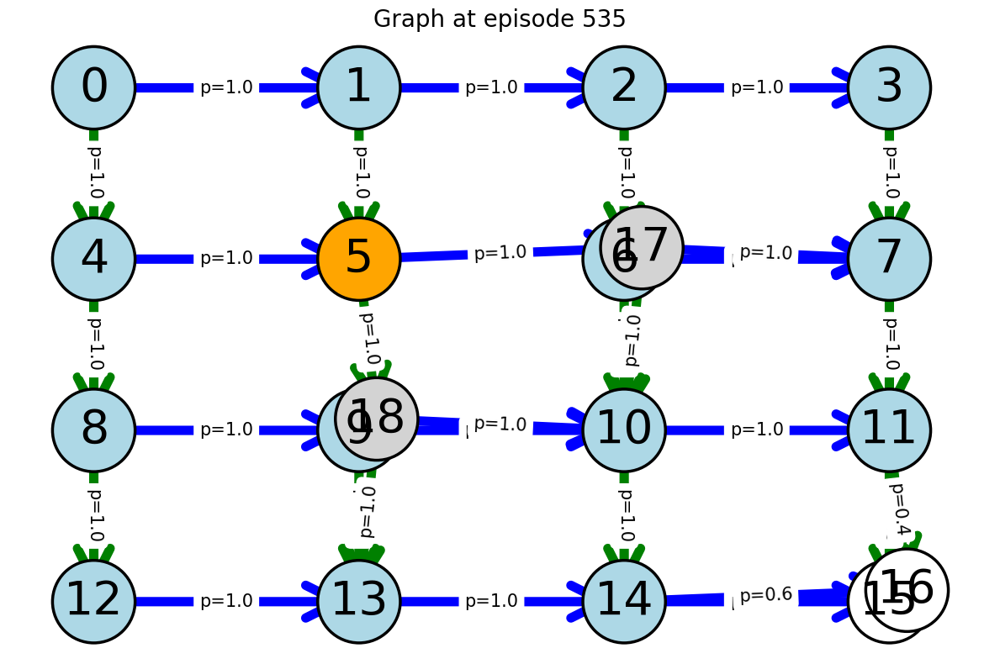

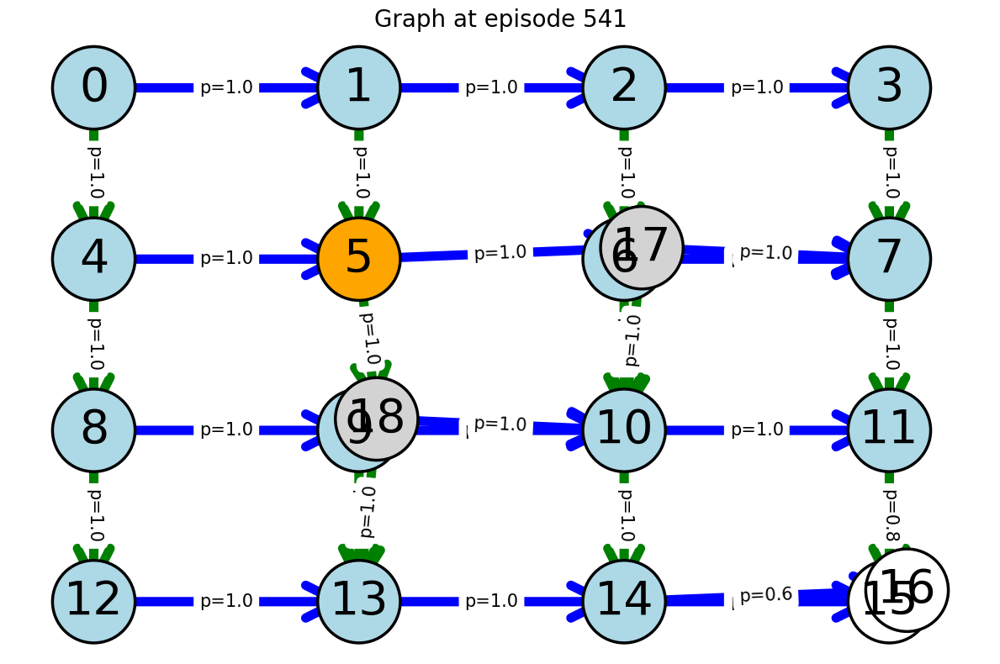

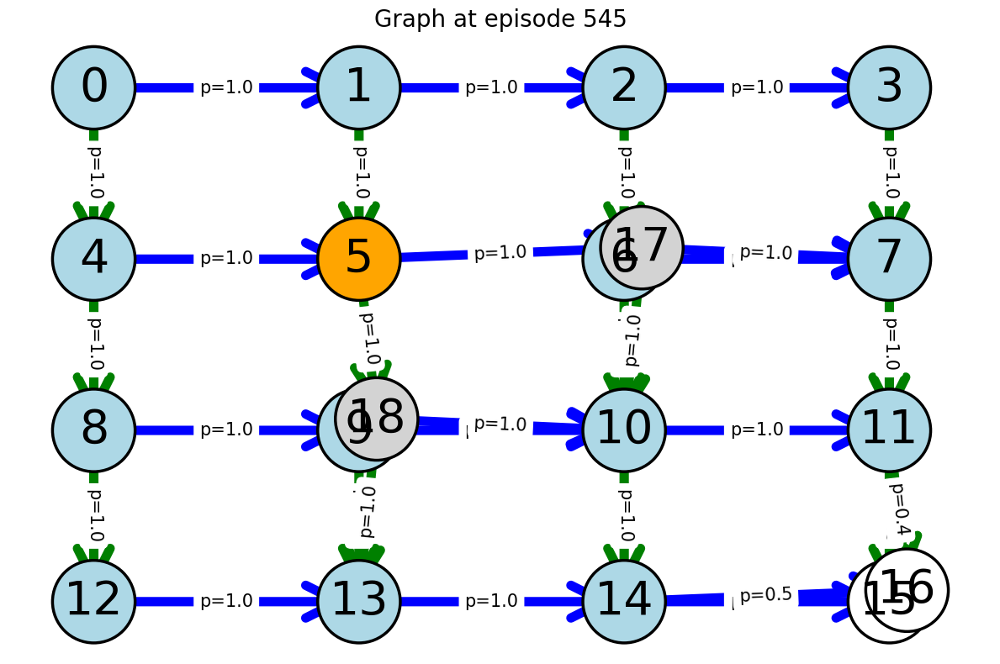

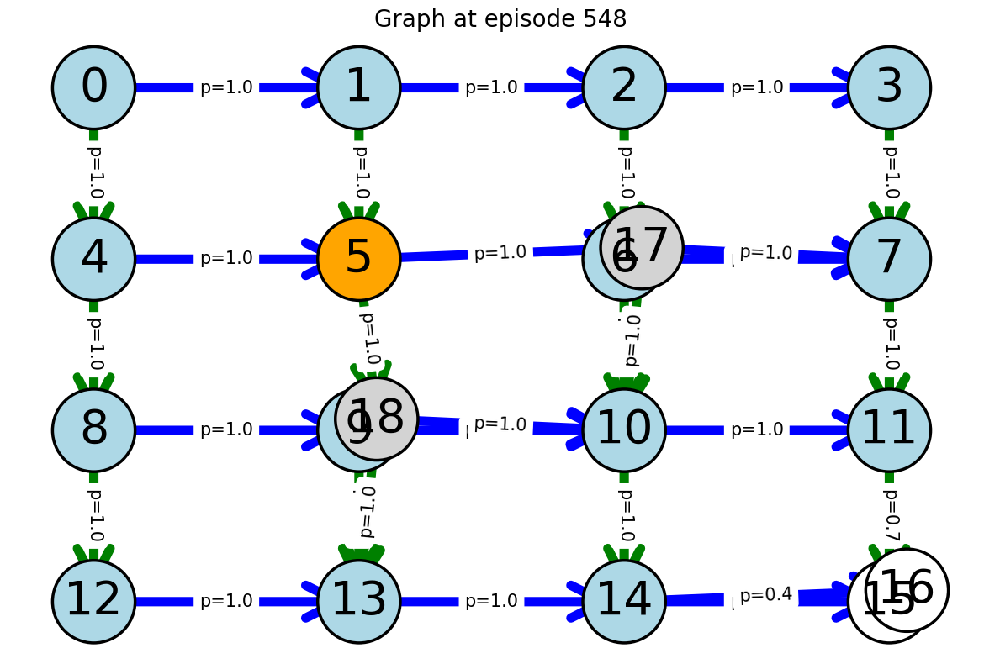

Extinction changed episodes: [251, 253, 255, 262, 266, 270, 279, 280, 281, 282, 293, 296, 302, 306, 307, 308, 309, 312, 313, 315, 321, 326, 327, 328, 349, 351, 354, 357, 358, 363] ... total: 65


In [7]:

# Extinction / degradation
THRESH = 0.3
prev_T, prev_map = prev_T, prev_map  # reuse from acquisition if you kept them
changed_ext = []

env2 = GridEnvRightDownNoCue(cue_states=[CUE], env_size=(4,4), rewarded_terminal=[15])
env2.clone_dict = dict(agent.env.clone_dict)
env2.reverse_clone_dict = dict(agent.env.reverse_clone_dict)
agent.env = env2

for ep in range(N_ACQ+1, N_ACQ+N_EXT+1):
    (states, actions) = generate_dataset_post_augmentation(env2, agent.get_T(), n_episodes=1, max_steps=MAX_STEPS)[0]
    agent.update_with_episode(states, actions)
    agent.maybe_merge()

    T_curr  = agent.get_T().copy()
    map_curr = clone_dict_tuple(env2.clone_dict)

    if graph_changed(prev_T, prev_map, T_curr, map_curr, thr=THRESH):
        # (optional) clean terminals/clones just for the figure:
        T_vis = make_terminals_absorbing_for_plot(T_curr, env2.rewarded_terminals + env2.unrewarded_terminals)
        sanitize_for_plot(env2, T_vis)
        env2.plot_graph(T_vis, niter=ep, threshold=THRESH, save=False, savename=f'graph_ep{ep}.png')

        changed_ext.append(ep)
        prev_T, prev_map = T_curr, map_curr

print("Extinction changed episodes:", changed_ext[:30], "... total:", len(changed_ext))


You can set `save=True` in `plot_graph` to export the changed snapshots as PNGs only for those episodes.

## Metrics: KL/JS vs episode, Entropy, and Markovization

In [8]:

# Collect T snapshots during acquisition and extinction.
# If you already recorded them earlier, just reuse those lists.
T_series_acq = []
T_series_ext = []

# Re-run quick pass to collect snapshots only (no plotting) -- uses your existing variables:
# Acquisition
with_clones = False
for ep in range(1, N_ACQ+1):
    if with_clones:
        (states, actions) = generate_dataset_post_augmentation(env, agent.get_T(), n_episodes=1, max_steps=MAX_STEPS)[0]
    else:
        (states, actions) = generate_dataset(env, n_episodes=1, max_steps=MAX_STEPS)[0]
    agent.update_with_episode(states, actions)
    if agent.maybe_split():
        with_clones = True
    T_series_acq.append(agent.get_T().copy())

# Extinction
env2 = GridEnvRightDownNoCue(cue_states=[CUE], env_size=(4,4), rewarded_terminal=[15])
env2.clone_dict = dict(getattr(env, "clone_dict", {}))
env2.reverse_clone_dict = dict(getattr(env, "reverse_clone_dict", {}))
agent.env = env2

for ep in range(N_ACQ+1, N_ACQ+N_EXT+1):
    (states, actions) = generate_dataset_post_augmentation(env2, agent.get_T(), n_episodes=1, max_steps=MAX_STEPS)[0]
    agent.update_with_episode(states, actions)
    agent.maybe_merge()
    T_series_ext.append(agent.get_T().copy())


In [10]:

# Compute metrics using the module we prepared
from coda_metrics import kl_over_time, entropy_over_time, markovization_score, ref_empirical_from_rollouts, greedy_right_down_policy
import numpy as np

def ref_builder_factory(env, policy_fn, nroll=300, max_steps=20):
    def _make_ref(T_learned):
        return ref_empirical_from_rollouts(env, policy_fn, n_episodes=nroll, max_steps=max_steps)
    return _make_ref

# Build episode-wise empirical references
ref_fn_acq = ref_builder_factory(env,  greedy_right_down_policy, nroll=300, max_steps=20)
ref_fn_ext = ref_builder_factory(env2, greedy_right_down_policy, nroll=300, max_steps=20)

KL_acq = kl_over_time(T_series_acq, ref_fn_acq, use_js=False)
JS_acq = kl_over_time(T_series_acq, ref_fn_acq, use_js=True)
H_acq  = entropy_over_time(T_series_acq)
MS_acq = np.array([markovization_score(T) for T in T_series_acq])

KL_ext = kl_over_time(T_series_ext, ref_fn_ext, use_js=False)
JS_ext = kl_over_time(T_series_ext, ref_fn_ext, use_js=True)
H_ext  = entropy_over_time(T_series_ext)
MS_ext = np.array([markovization_score(T) for T in T_series_ext])


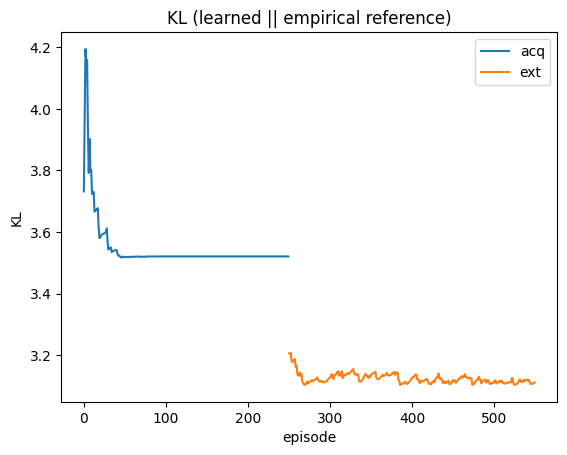

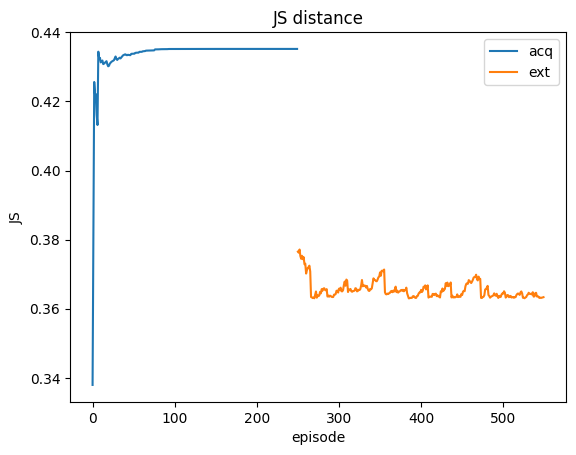

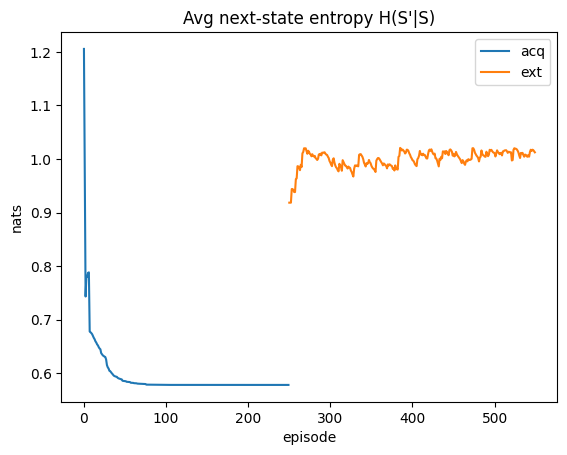

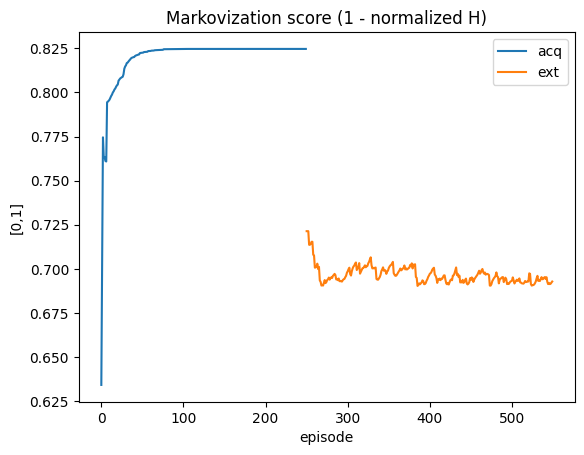

In [11]:

# Plot (one metric per figure)
import matplotlib.pyplot as plt
import numpy as np

def _offset_plot(ax, y1, y2, label1, label2):
    ax.plot(y1, label=label1)
    off = len(y1)
    ax.plot(off + np.arange(len(y2)), y2, label=label2)
    ax.legend()
    ax.set_xlabel("episode")

fig, ax = plt.subplots()
ax.set_title("KL (learned || empirical reference)")
_offset_plot(ax, KL_acq, KL_ext, "acq", "ext")
ax.set_ylabel("KL")
plt.show()

fig, ax = plt.subplots()
ax.set_title("JS distance")
_offset_plot(ax, JS_acq, JS_ext, "acq", "ext")
ax.set_ylabel("JS")
plt.show()

fig, ax = plt.subplots()
ax.set_title("Avg next-state entropy H(S'|S)")
_offset_plot(ax, H_acq, H_ext, "acq", "ext")
ax.set_ylabel("nats")
plt.show()

fig, ax = plt.subplots()
ax.set_title("Markovization score (1 - normalized H)")
_offset_plot(ax, MS_acq, MS_ext, "acq", "ext")
ax.set_ylabel("[0,1]")
plt.show()
